# <center>M2 DAC -   Reinforcement Learning & Advanced Deep</center>
##  <center> TME 9. Generative Adversarial Networks  </center>

Ce TME a pour objectif d'expérimenter les Generative Adversarial Networks (GANs) sur un problème de génération de visages. 

De manière classique, un GAN se formule selon un problème adverse de la manière suivante: 
$$\min\limits_{G} \max\limits_D V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]$$
Cette formulation met en jeu deux réseaux adverse: 
*   Un réseau discriminateur $D$, dont l'objectif est de savoir distinguer les données réelles des données simulées  
*   Un réseau générateur $G$, dont l'objectif est de flouer le discriminateur

À l'optimum, avec des réseaux de capacité infinie, la distribution $p_G$ des données générées par $G$ est prouvée suivre la distribution des données réelles $p_{data}$. Bien sûr nous ne travaillons pas avec des réseaux de capacité infinie (et d'ailleurs heureusement car on ne veut pas apprendre par coeur les données d'apprentissage), mais l'objectif est d'approcher cette distribution $p_{data}$ en apprenant un générateur neuronal dont les sorties sont difficilement distinguables des vraies données pour le discriminateur. 

Nous proposons de mettre ce genre d'architecture pour un la génération de visages: selon un ensemble de visages d'entraînement, il s'agit d'apprendre à générer des visages qui paraissent les plus réalistes possibles tout en conservant une certaine diversité dans les distributions de sortie. Pour cela nous emploierons une architecture DCGAN, qui utilise des réseaux de neurones convolutionnels (CNNs) pour le générateur et le discriminateur.    


 



Pour ce TP, nous vous proposons de travailler avec Google Colab qui est un service notebook en ligne avec ressources machines à disposition (nécessite d'être connecté à un compte google personnel):
*   https://colab.research.google.com/
*   Ouvrir ce Notebook avec "File>Upload Notebook"
*   Sélectionner un Runtime GPU : Runtime>Change Runtime Type (utile de le faire avant tout téléchargement de données car le changement de Runtime efface les données temporaires de la session)

Pour télécharger les données utiles au TP: 


*   Aller à l'adresse : https://drive.google.com/open?id=0B7EVK8r0v71pWEZsZE9oNnFzTm8
*   Clic-droit sur CelebA, Ajouter à mon Drive
*   Exécuter le code ci-dessous (une autorisation vous sera demandée, suivre le lien donné à l'exécution pour obtenir le code d'authentification)

(Sinon vous pouvez aussi travailler en local en téléchargeant les données sur votre ordinateur mais attention fichier volumineux et colab propose des ressources GPU utiles à la résolution du TP)

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Vous devez maintenant avoir dans le paneau de gauche un onglet Files contenant un répertoire drive dans l'arborescence. C'est votre espace de stockage Google Drive. Il devrait contenir un répertoire CelebA (si ce n'est pas le cas attendre un peu et rafraichir, il peut mettre un certain temps à apparaître). 

Il s'agit maintenant de décompresser l'archive téléchargée (cela peut prendre jusqu'à une dizaine de minutes): 



In [ ]:
!unzip drive/My\ Drive/CelebA/Img/img_align_celeba -d data

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
 extracting: data/img_align_celeba/197600.jpg  
 extracting: data/img_align_celeba/197601.jpg  
 extracting: data/img_align_celeba/197602.jpg  
 extracting: data/img_align_celeba/197603.jpg  
 extracting: data/img_align_celeba/197604.jpg  
 extracting: data/img_align_celeba/197605.jpg  
 extracting: data/img_align_celeba/197606.jpg  
 extracting: data/img_align_celeba/197607.jpg  
 extracting: data/img_align_celeba/197608.jpg  
 extracting: data/img_align_celeba/197609.jpg  
 extracting: data/img_align_celeba/197610.jpg  
 extracting: data/img_align_celeba/197611.jpg  
 extracting: data/img_align_celeba/197612.jpg  
 extracting: data/img_align_celeba/197613.jpg  
 extracting: data/img_align_celeba/197614.jpg  
 extracting: data/img_align_celeba/197615.jpg  
 extracting: data/img_align_celeba/197616.jpg  
 extracting: data/img_align_celeba/197617.jpg  
 extracting: data/img_align_celeba/197618.jpg  
 extractin

Cela produit un répertoire data à la racine du repertoire temporaire de votre Google Colab. Ce repertoire contient un sous-repertoire img_align_celeba contenant une liste de 202599 fichiers jpg correspondant à des photos de visages de célébrités (attention ce repertoire est temporaire, tout ce qui n'est pas dans un drive est effacé à la fin de la session). 



In [ ]:

import numpy as np
try:
    import torch
except:
    !pip3 install torch==1.2.0+cu92 torchvision==0.4.0+cu92 -f https://download.pytorch.org/whl/torch_stable.html
    import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.utils.data
import torchvision.datasets as dset
import torchvision.utils as vutils
import torch.backends.cudnn as cudnn




    

Le code ci-dessous permet de déclarer la manière de charger les données. 

Lorsque des données sont demandées (pour la construction d'un nouveau batch par exemple), une série de transformations est appliquée sur les images, selon la composition de transformateurs déclarée pour le chargement: 
*    redimentionnement des images en 64 par 64
*    recadrage au centre (qui ne fait rien ici car image déjà dans la taille du cadre mais si utile pour d'autres paramètres)
*    conversion en tenseur pytorch 
*    normalisation des valeurs RGB selon une moyenne de 0.5 et un ecart-type de 0.5.



In [ ]:
image_size = 64
dataset = dset.ImageFolder(root="data",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

In [ ]:
print(dataset)

Dataset ImageFolder
    Number of datapoints: 202599
    Root location: data
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=PIL.Image.BILINEAR)
               CenterCrop(size=(64, 64))
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )


Le code ci-dessous permet de déclarer la manière de charger les images et en affiche un échantillon. 

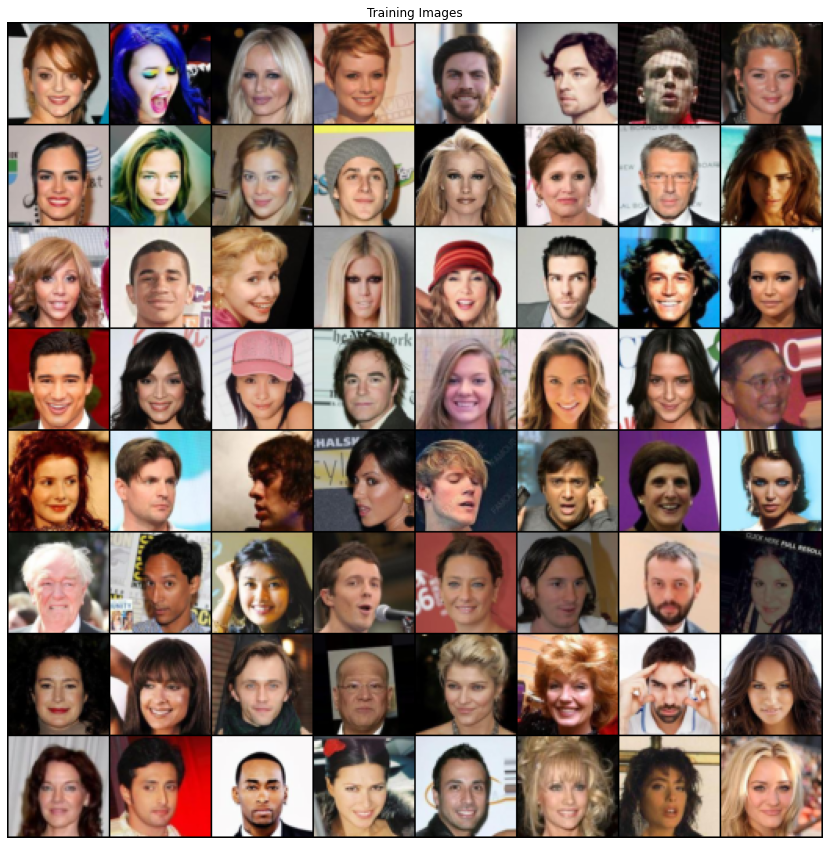

In [ ]:
import matplotlib.pyplot as plt
import os



seed=0
torch.manual_seed(seed)
np.random.seed(seed)
device=0
if device>=0 and torch.cuda.is_available():
  cudnn.benchmark = True
  torch.cuda.device(device)
  torch.cuda.manual_seed(seed)
else: 
  device=-1

batch_size = 128
workers = 8

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Affichage de quelques images
real_batch = next(iter(dataloader)) #real_batch est une liste de 2 tenseurs où le 1er correspond aux images, les second correspond aux labels (ici 0 partout)

plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=1, normalize=True).cpu(),(1,2,0)))
os.makedirs("drive/My Drive/genFaces",exist_ok=True)
plt.savefig("drive/My Drive/genFaces/train.png" ) # Pour sauvegarder l'image sur votre Google Drive 


Le réseau $D$ est un empilement de couches de convolution 2D avec batchNorm2D et activations RELU: 

In [ ]:

nc = 3 # Nombre de canaux de l'entrée
ndf = 64 # Facteur du nombre de canaux de sortie des différentes couches de convolution


# Initialisation recommandee pour netG et netD dans DCGAN
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
nz=100  #Taille du vecteur z donné en entrée du générateur
ngf = 64 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


Donner la procédure d'entraînement de ces deux réseaux. L'optimisation se fera ADAM selon les deux coûts adverses du discriminateur et du générateur. Pour chaque nouveau batch d'images, on alterne les deux mises à jour suivantes, selon un batch de vecteurs $z$ tirés aléatoirement selon une loi normale centrée réduite (un nouveau batch de $z$ à chaque itération): 

1.   Un pas de gradient sur les paramètres du réseau D pour maximiser:  $log(D(x)) + log(1 - D(G(z)))$
2.   Un pas de gradient sur les paramètres du réseau G pour maximiser:  $log(D(G(z)))$ 


Afin de suivre l'évolution de l'apprentissage, on pourra logguer l'erreur du discriminateur relevée en 1, l'erreur du générateur relevée en 2, la moyenne des sorties du discriminateur sur les images réelles et la moyenne des sorties du discriminateur sur les images générées.

À la fin de chaque époque (i.e., lorsque l'on a itéré sur tous les batchs du DataLoader), on pourra enregistrer les images générées à partir d'un batch de vecteurs $z$ fixe dans le Google Drive pour observer l'évolution des capacités du générateur.  



In [ ]:
# Prior P(z). Returns a Gaussian random tensor of shape (batch_size, nz, 1, 1)
def get_noise(batch_size):
    noise = torch.randn(batch_size, nz, 1, 1) # TODO
    return noise.to(device)

## Optimization
lrD = 0.0002 # Learning rate for the discriminator
lrG = 0.0002 # Learning rate for the generator

beta1G = 0.5 # Momentum beta1 for the discriminator
beta1D = 0.5 # Momentum beta1 for the generator

## Training
nb_update_D = 1 # Number of sub-steps of discriminator optim. at each step
nb_update_G = 1 # Number of sub-steps of generator optim. at each step
steps = 20000 # Number of global steps in the training loop

criterion = nn.BCELoss() 

# Setup Adam optimizers for D and G
optimizerD = torch.optim.Adam(netD.parameters(), lr=lrD, betas=(beta1D, 0.999)) 
optimizerG = torch.optim.Adam(netG.parameters(), lr=lrG, betas=(beta1G, 0.999)) 


In [ ]:
# Data format / batch creation functions
fixed_noise = get_noise(196) # Create a fixed random vector sampled from a Gaussian, will be used during train for viz
real_label = 1
fake_label = 0
iterator = iter(dataloader)

# returns a batch of real images from the dataset (iterates infinitely on the dataset)
def get_batch_real():
    global iterator
    try:
        x_real = next(iterator)[0].to(device)
    except:
        iterator = iter(dataloader)
        x_real = next(iterator)[0].to(device)
    y_real = torch.full((x_real.size(0),), real_label, device=device)
    return x_real, y_real

# returns a batch of generated images and training targets y_fake
# Note that the targets y_fake will be different is train_G is True or False
def get_batch_fake(train_G=False):
    z = get_noise(batch_size)
    x_fake = netG(z) # TODO generate images from z
    if(train_G):
      y_fake = torch.ones((batch_size),requires_grad=False) 
    else:
      y_fake = torch.zeros((batch_size),requires_grad=False) # create targets, depends on train_G
    return x_fake, y_fake.to(device)

[    0/20000]	Loss_D: 2.2190	Loss_G: 5.3036	D(x): 0.7324	D(G(z)): 0.7750


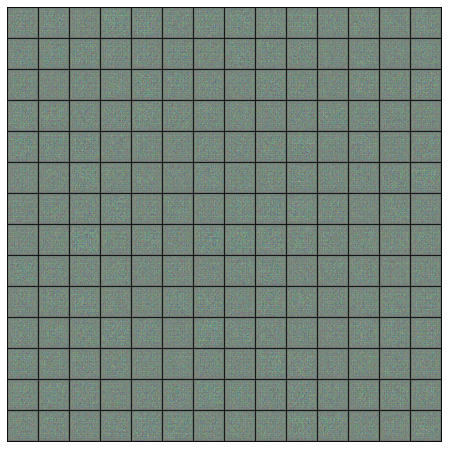

[   25/20000]	Loss_D: 0.2086	Loss_G: 28.9911	D(x): 0.8873	D(G(z)): 0.0000
[   50/20000]	Loss_D: 0.0205	Loss_G: 37.2084	D(x): 0.9866	D(G(z)): 0.0000
[   75/20000]	Loss_D: 0.0009	Loss_G: 35.0152	D(x): 0.9991	D(G(z)): 0.0000
[  100/20000]	Loss_D: 0.0019	Loss_G: 21.9853	D(x): 0.9982	D(G(z)): 0.0000
[  125/20000]	Loss_D: 0.2302	Loss_G: 5.5930	D(x): 0.9492	D(G(z)): 0.0926
[  150/20000]	Loss_D: 0.6086	Loss_G: 11.3336	D(x): 0.8936	D(G(z)): 0.2781
[  175/20000]	Loss_D: 0.4824	Loss_G: 4.9404	D(x): 0.8618	D(G(z)): 0.2097
[  200/20000]	Loss_D: 1.0496	Loss_G: 5.9145	D(x): 0.5182	D(G(z)): 0.0134
[  225/20000]	Loss_D: 0.6555	Loss_G: 6.4052	D(x): 0.9199	D(G(z)): 0.3617
[  250/20000]	Loss_D: 0.4132	Loss_G: 4.3579	D(x): 0.8251	D(G(z)): 0.1424
[  275/20000]	Loss_D: 0.8314	Loss_G: 7.0699	D(x): 0.8831	D(G(z)): 0.4093
[  300/20000]	Loss_D: 0.4976	Loss_G: 2.8080	D(x): 0.7422	D(G(z)): 0.1210
[  325/20000]	Loss_D: 1.0831	Loss_G: 4.6889	D(x): 0.8186	D(G(z)): 0.4537
[  350/20000]	Loss_D: 0.6894	Loss_G: 3.4305	D(

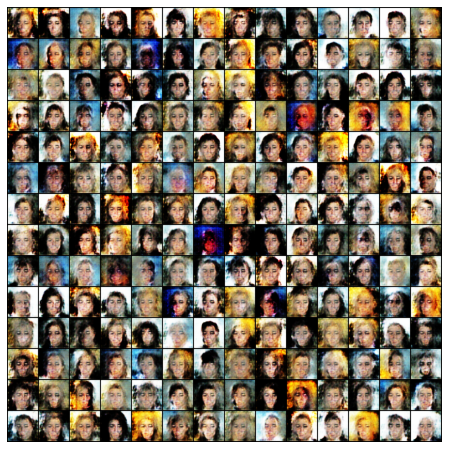

[ 1025/20000]	Loss_D: 0.4001	Loss_G: 4.4250	D(x): 0.8557	D(G(z)): 0.1560
[ 1050/20000]	Loss_D: 0.5660	Loss_G: 5.8384	D(x): 0.9278	D(G(z)): 0.3336
[ 1075/20000]	Loss_D: 0.4327	Loss_G: 2.7112	D(x): 0.7983	D(G(z)): 0.1119
[ 1100/20000]	Loss_D: 0.3576	Loss_G: 4.0357	D(x): 0.9306	D(G(z)): 0.2152
[ 1125/20000]	Loss_D: 0.6668	Loss_G: 4.2704	D(x): 0.8035	D(G(z)): 0.2988
[ 1150/20000]	Loss_D: 0.6091	Loss_G: 4.4902	D(x): 0.9131	D(G(z)): 0.3448
[ 1175/20000]	Loss_D: 0.6708	Loss_G: 3.7719	D(x): 0.7655	D(G(z)): 0.2511
[ 1200/20000]	Loss_D: 0.7159	Loss_G: 3.8669	D(x): 0.8226	D(G(z)): 0.3212
[ 1225/20000]	Loss_D: 0.6056	Loss_G: 4.7982	D(x): 0.9335	D(G(z)): 0.3625
[ 1250/20000]	Loss_D: 0.5812	Loss_G: 2.2258	D(x): 0.6569	D(G(z)): 0.0577
[ 1275/20000]	Loss_D: 0.5873	Loss_G: 4.2954	D(x): 0.8257	D(G(z)): 0.2599
[ 1300/20000]	Loss_D: 0.9036	Loss_G: 2.4415	D(x): 0.6593	D(G(z)): 0.2689
[ 1325/20000]	Loss_D: 0.3602	Loss_G: 3.3136	D(x): 0.8431	D(G(z)): 0.1314
[ 1350/20000]	Loss_D: 0.4335	Loss_G: 4.0053	D(x): 0

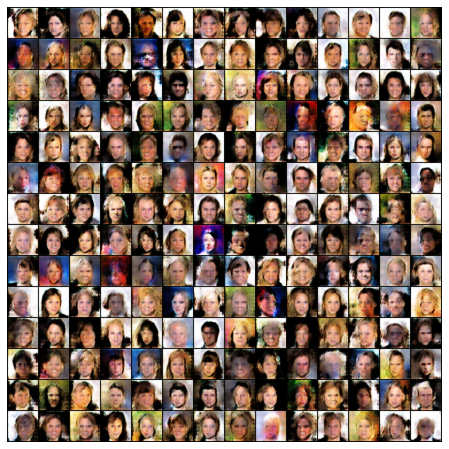

[ 2025/20000]	Loss_D: 0.4413	Loss_G: 3.2732	D(x): 0.7718	D(G(z)): 0.1197
[ 2050/20000]	Loss_D: 0.6531	Loss_G: 2.3431	D(x): 0.6033	D(G(z)): 0.0293
[ 2075/20000]	Loss_D: 0.6186	Loss_G: 2.1015	D(x): 0.6769	D(G(z)): 0.1198
[ 2100/20000]	Loss_D: 0.5527	Loss_G: 4.5225	D(x): 0.8466	D(G(z)): 0.2613
[ 2125/20000]	Loss_D: 0.6748	Loss_G: 3.0020	D(x): 0.6740	D(G(z)): 0.1306
[ 2150/20000]	Loss_D: 0.4739	Loss_G: 2.6640	D(x): 0.7826	D(G(z)): 0.1569
[ 2175/20000]	Loss_D: 0.6339	Loss_G: 4.3642	D(x): 0.9248	D(G(z)): 0.3842
[ 2200/20000]	Loss_D: 0.3866	Loss_G: 3.2784	D(x): 0.8690	D(G(z)): 0.1914
[ 2225/20000]	Loss_D: 0.4132	Loss_G: 2.3981	D(x): 0.7641	D(G(z)): 0.0616
[ 2250/20000]	Loss_D: 0.6576	Loss_G: 2.2628	D(x): 0.6524	D(G(z)): 0.1211
[ 2275/20000]	Loss_D: 0.4337	Loss_G: 2.7861	D(x): 0.8073	D(G(z)): 0.1509
[ 2300/20000]	Loss_D: 0.5952	Loss_G: 2.2389	D(x): 0.6582	D(G(z)): 0.0739
[ 2325/20000]	Loss_D: 0.3706	Loss_G: 3.5244	D(x): 0.9144	D(G(z)): 0.2235
[ 2350/20000]	Loss_D: 0.4224	Loss_G: 3.6261	D(x): 0

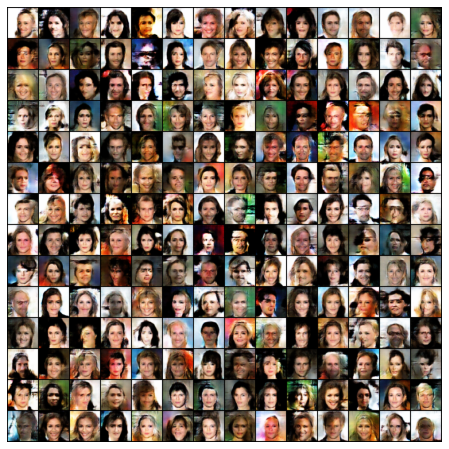

[ 3025/20000]	Loss_D: 0.6829	Loss_G: 3.3223	D(x): 0.8764	D(G(z)): 0.3814
[ 3050/20000]	Loss_D: 0.8110	Loss_G: 4.5348	D(x): 0.9345	D(G(z)): 0.4687
[ 3075/20000]	Loss_D: 0.4472	Loss_G: 2.7250	D(x): 0.7940	D(G(z)): 0.1593
[ 3100/20000]	Loss_D: 0.4933	Loss_G: 2.3541	D(x): 0.7894	D(G(z)): 0.1905
[ 3125/20000]	Loss_D: 1.8181	Loss_G: 6.1798	D(x): 0.9581	D(G(z)): 0.7615
[ 3150/20000]	Loss_D: 0.6464	Loss_G: 3.3396	D(x): 0.8294	D(G(z)): 0.3144
[ 3175/20000]	Loss_D: 0.5422	Loss_G: 2.0030	D(x): 0.7097	D(G(z)): 0.1240
[ 3200/20000]	Loss_D: 0.4622	Loss_G: 1.7587	D(x): 0.7658	D(G(z)): 0.1405
[ 3225/20000]	Loss_D: 0.5411	Loss_G: 2.7295	D(x): 0.7845	D(G(z)): 0.2151
[ 3250/20000]	Loss_D: 0.5934	Loss_G: 3.0792	D(x): 0.8283	D(G(z)): 0.2941
[ 3275/20000]	Loss_D: 0.4400	Loss_G: 2.6065	D(x): 0.7676	D(G(z)): 0.1262
[ 3300/20000]	Loss_D: 0.4825	Loss_G: 2.2163	D(x): 0.7312	D(G(z)): 0.1208
[ 3325/20000]	Loss_D: 0.8616	Loss_G: 1.7201	D(x): 0.5642	D(G(z)): 0.1721
[ 3350/20000]	Loss_D: 0.5701	Loss_G: 2.1555	D(x): 0

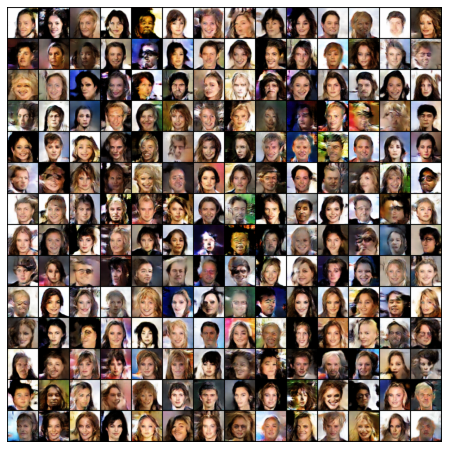

[ 4025/20000]	Loss_D: 1.0204	Loss_G: 1.5930	D(x): 0.6192	D(G(z)): 0.3083
[ 4050/20000]	Loss_D: 0.6742	Loss_G: 3.1928	D(x): 0.8889	D(G(z)): 0.3851
[ 4075/20000]	Loss_D: 0.6259	Loss_G: 2.6698	D(x): 0.8113	D(G(z)): 0.3047
[ 4100/20000]	Loss_D: 0.6427	Loss_G: 2.8249	D(x): 0.8521	D(G(z)): 0.3455
[ 4125/20000]	Loss_D: 0.5327	Loss_G: 2.0212	D(x): 0.7920	D(G(z)): 0.2218
[ 4150/20000]	Loss_D: 0.6499	Loss_G: 3.0681	D(x): 0.8374	D(G(z)): 0.3345
[ 4175/20000]	Loss_D: 0.4485	Loss_G: 2.7647	D(x): 0.8477	D(G(z)): 0.2233
[ 4200/20000]	Loss_D: 0.8648	Loss_G: 1.6361	D(x): 0.5864	D(G(z)): 0.1702
[ 4225/20000]	Loss_D: 0.6382	Loss_G: 2.5009	D(x): 0.7726	D(G(z)): 0.2681
[ 4250/20000]	Loss_D: 0.6345	Loss_G: 1.8223	D(x): 0.6683	D(G(z)): 0.1450
[ 4275/20000]	Loss_D: 0.7383	Loss_G: 1.4204	D(x): 0.5849	D(G(z)): 0.0883
[ 4300/20000]	Loss_D: 0.6749	Loss_G: 1.4674	D(x): 0.6227	D(G(z)): 0.1183
[ 4325/20000]	Loss_D: 0.5108	Loss_G: 2.7236	D(x): 0.7996	D(G(z)): 0.2125
[ 4350/20000]	Loss_D: 0.5440	Loss_G: 1.7986	D(x): 0

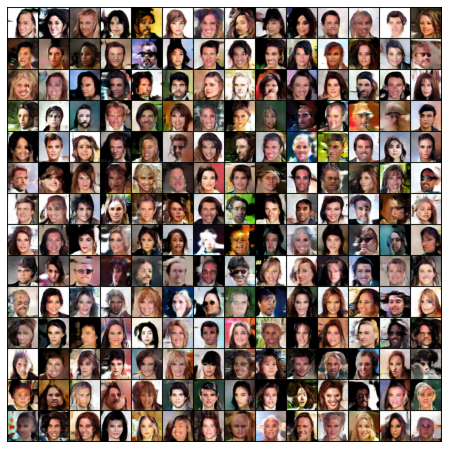

[ 5025/20000]	Loss_D: 0.6327	Loss_G: 1.7507	D(x): 0.6542	D(G(z)): 0.1359
[ 5050/20000]	Loss_D: 1.2571	Loss_G: 4.5689	D(x): 0.9325	D(G(z)): 0.6421
[ 5075/20000]	Loss_D: 0.9748	Loss_G: 1.0064	D(x): 0.4582	D(G(z)): 0.0674
[ 5100/20000]	Loss_D: 0.6704	Loss_G: 1.7289	D(x): 0.6616	D(G(z)): 0.1606
[ 5125/20000]	Loss_D: 0.4227	Loss_G: 2.1836	D(x): 0.7890	D(G(z)): 0.1456
[ 5150/20000]	Loss_D: 1.5967	Loss_G: 4.9560	D(x): 0.9608	D(G(z)): 0.7299
[ 5175/20000]	Loss_D: 0.5760	Loss_G: 2.5583	D(x): 0.6926	D(G(z)): 0.1511
[ 5200/20000]	Loss_D: 0.5925	Loss_G: 2.5586	D(x): 0.8257	D(G(z)): 0.3021
[ 5225/20000]	Loss_D: 0.9316	Loss_G: 3.4799	D(x): 0.9043	D(G(z)): 0.5242
[ 5250/20000]	Loss_D: 0.5981	Loss_G: 1.2769	D(x): 0.7119	D(G(z)): 0.1858
[ 5275/20000]	Loss_D: 0.4538	Loss_G: 3.0197	D(x): 0.8821	D(G(z)): 0.2525
[ 5300/20000]	Loss_D: 0.5743	Loss_G: 1.8022	D(x): 0.6907	D(G(z)): 0.1340
[ 5325/20000]	Loss_D: 2.1853	Loss_G: 0.4883	D(x): 0.1654	D(G(z)): 0.0489
[ 5350/20000]	Loss_D: 0.7449	Loss_G: 1.4500	D(x): 0

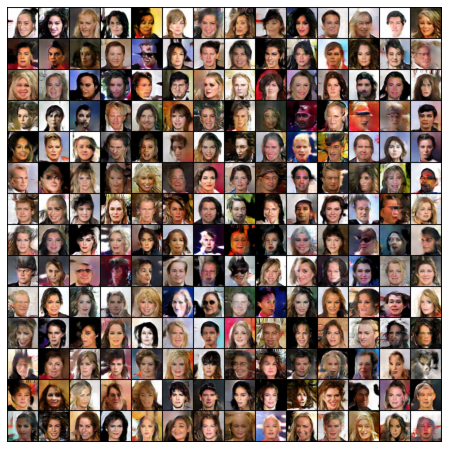

[ 6025/20000]	Loss_D: 0.8293	Loss_G: 1.4999	D(x): 0.5338	D(G(z)): 0.0565
[ 6050/20000]	Loss_D: 0.6425	Loss_G: 1.6103	D(x): 0.6286	D(G(z)): 0.0954
[ 6075/20000]	Loss_D: 0.8636	Loss_G: 2.7221	D(x): 0.8749	D(G(z)): 0.4611
[ 6100/20000]	Loss_D: 0.8497	Loss_G: 4.3422	D(x): 0.9002	D(G(z)): 0.4681
[ 6125/20000]	Loss_D: 0.8248	Loss_G: 1.7141	D(x): 0.5572	D(G(z)): 0.1071
[ 6150/20000]	Loss_D: 0.6461	Loss_G: 2.8099	D(x): 0.8892	D(G(z)): 0.3793
[ 6175/20000]	Loss_D: 1.4974	Loss_G: 2.1209	D(x): 0.7232	D(G(z)): 0.5850
[ 6200/20000]	Loss_D: 0.7115	Loss_G: 2.4227	D(x): 0.8516	D(G(z)): 0.3795
[ 6225/20000]	Loss_D: 1.0029	Loss_G: 4.3896	D(x): 0.9136	D(G(z)): 0.5435
[ 6250/20000]	Loss_D: 0.4851	Loss_G: 2.0687	D(x): 0.7840	D(G(z)): 0.1706
[ 6275/20000]	Loss_D: 0.8327	Loss_G: 1.2795	D(x): 0.5084	D(G(z)): 0.0503
[ 6300/20000]	Loss_D: 0.7849	Loss_G: 1.9535	D(x): 0.6105	D(G(z)): 0.1817
[ 6325/20000]	Loss_D: 0.4940	Loss_G: 1.7447	D(x): 0.7536	D(G(z)): 0.1577
[ 6350/20000]	Loss_D: 0.5987	Loss_G: 2.2676	D(x): 0

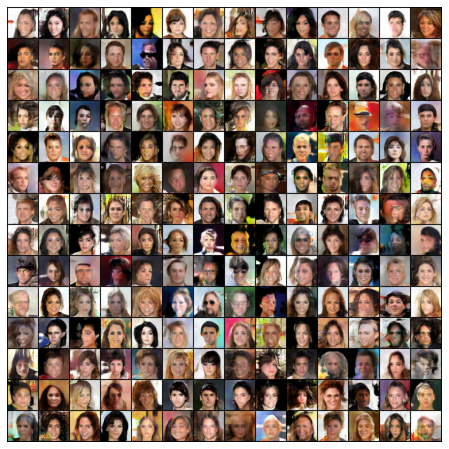

[ 7025/20000]	Loss_D: 0.7561	Loss_G: 1.9233	D(x): 0.7790	D(G(z)): 0.3463
[ 7050/20000]	Loss_D: 0.5137	Loss_G: 3.1097	D(x): 0.9119	D(G(z)): 0.3097
[ 7075/20000]	Loss_D: 0.5510	Loss_G: 1.5624	D(x): 0.6995	D(G(z)): 0.1347
[ 7100/20000]	Loss_D: 0.8876	Loss_G: 3.4748	D(x): 0.8134	D(G(z)): 0.4409
[ 7125/20000]	Loss_D: 0.5021	Loss_G: 2.9322	D(x): 0.9194	D(G(z)): 0.3122
[ 7150/20000]	Loss_D: 0.4824	Loss_G: 3.7876	D(x): 0.9254	D(G(z)): 0.3025
[ 7175/20000]	Loss_D: 1.0513	Loss_G: 3.8875	D(x): 0.9397	D(G(z)): 0.5720
[ 7200/20000]	Loss_D: 0.8460	Loss_G: 2.5272	D(x): 0.7317	D(G(z)): 0.3343
[ 7225/20000]	Loss_D: 0.5163	Loss_G: 2.6521	D(x): 0.8388	D(G(z)): 0.2546
[ 7250/20000]	Loss_D: 0.7147	Loss_G: 1.9870	D(x): 0.5751	D(G(z)): 0.0687
[ 7275/20000]	Loss_D: 0.6900	Loss_G: 2.9178	D(x): 0.7895	D(G(z)): 0.3110
[ 7300/20000]	Loss_D: 0.6844	Loss_G: 2.1689	D(x): 0.5835	D(G(z)): 0.0537
[ 7325/20000]	Loss_D: 0.6301	Loss_G: 1.9231	D(x): 0.7089	D(G(z)): 0.2122
[ 7350/20000]	Loss_D: 0.4323	Loss_G: 2.1063	D(x): 0

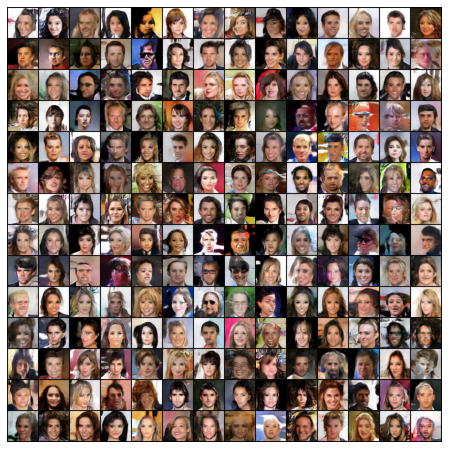

[ 8025/20000]	Loss_D: 2.2108	Loss_G: 3.2814	D(x): 0.8796	D(G(z)): 0.7794
[ 8050/20000]	Loss_D: 0.8177	Loss_G: 3.5995	D(x): 0.9504	D(G(z)): 0.4876
[ 8075/20000]	Loss_D: 0.5021	Loss_G: 2.1154	D(x): 0.7569	D(G(z)): 0.1709
[ 8100/20000]	Loss_D: 0.5475	Loss_G: 2.2066	D(x): 0.7441	D(G(z)): 0.1777
[ 8125/20000]	Loss_D: 1.0235	Loss_G: 0.7470	D(x): 0.4246	D(G(z)): 0.0424
[ 8150/20000]	Loss_D: 0.6969	Loss_G: 3.7063	D(x): 0.9347	D(G(z)): 0.4317
[ 8175/20000]	Loss_D: 0.4592	Loss_G: 3.1162	D(x): 0.8697	D(G(z)): 0.2431
[ 8200/20000]	Loss_D: 0.7660	Loss_G: 1.7976	D(x): 0.6584	D(G(z)): 0.2232
[ 8225/20000]	Loss_D: 0.6439	Loss_G: 2.3912	D(x): 0.6873	D(G(z)): 0.1818
[ 8250/20000]	Loss_D: 1.4645	Loss_G: 4.6276	D(x): 0.9158	D(G(z)): 0.6740
[ 8275/20000]	Loss_D: 0.4462	Loss_G: 2.8125	D(x): 0.8263	D(G(z)): 0.1955
[ 8300/20000]	Loss_D: 0.6218	Loss_G: 3.0894	D(x): 0.8123	D(G(z)): 0.3011
[ 8325/20000]	Loss_D: 0.7216	Loss_G: 3.0312	D(x): 0.8974	D(G(z)): 0.4113
[ 8350/20000]	Loss_D: 0.7808	Loss_G: 3.6955	D(x): 0

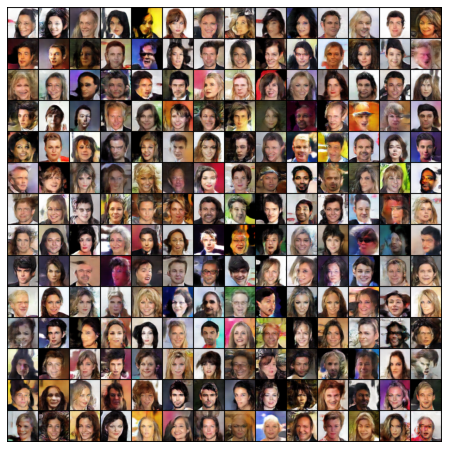

[ 9025/20000]	Loss_D: 0.4375	Loss_G: 1.9307	D(x): 0.7985	D(G(z)): 0.1623
[ 9050/20000]	Loss_D: 0.5041	Loss_G: 1.8964	D(x): 0.7062	D(G(z)): 0.1071
[ 9075/20000]	Loss_D: 0.5297	Loss_G: 1.7343	D(x): 0.6991	D(G(z)): 0.1159
[ 9100/20000]	Loss_D: 0.7466	Loss_G: 2.2459	D(x): 0.7399	D(G(z)): 0.3018
[ 9125/20000]	Loss_D: 0.9463	Loss_G: 1.1779	D(x): 0.4758	D(G(z)): 0.0319
[ 9150/20000]	Loss_D: 1.6321	Loss_G: 5.2299	D(x): 0.9803	D(G(z)): 0.7401
[ 9175/20000]	Loss_D: 0.6896	Loss_G: 3.8042	D(x): 0.9396	D(G(z)): 0.4258
[ 9200/20000]	Loss_D: 0.4777	Loss_G: 2.3271	D(x): 0.7885	D(G(z)): 0.1801
[ 9225/20000]	Loss_D: 0.6088	Loss_G: 2.8776	D(x): 0.8111	D(G(z)): 0.2833
[ 9250/20000]	Loss_D: 0.3929	Loss_G: 2.5349	D(x): 0.7967	D(G(z)): 0.1269
[ 9275/20000]	Loss_D: 0.4038	Loss_G: 3.3087	D(x): 0.9049	D(G(z)): 0.2444
[ 9300/20000]	Loss_D: 0.3566	Loss_G: 2.3193	D(x): 0.8913	D(G(z)): 0.1904
[ 9325/20000]	Loss_D: 0.4448	Loss_G: 2.2520	D(x): 0.8405	D(G(z)): 0.2135
[ 9350/20000]	Loss_D: 0.4544	Loss_G: 2.5397	D(x): 0

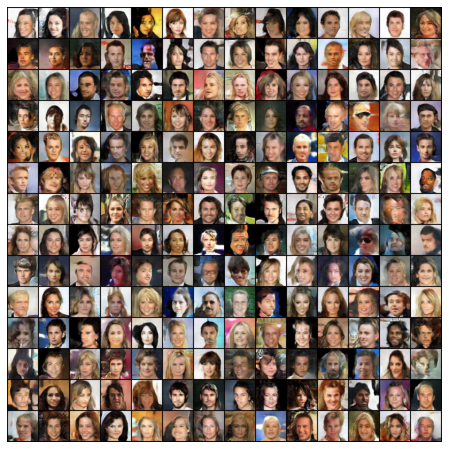

[10025/20000]	Loss_D: 0.3967	Loss_G: 3.2357	D(x): 0.7991	D(G(z)): 0.1219
[10050/20000]	Loss_D: 0.6004	Loss_G: 3.6377	D(x): 0.9420	D(G(z)): 0.3647
[10075/20000]	Loss_D: 0.5961	Loss_G: 3.8522	D(x): 0.9685	D(G(z)): 0.3933
[10100/20000]	Loss_D: 0.5157	Loss_G: 4.1832	D(x): 0.9251	D(G(z)): 0.3245
[10125/20000]	Loss_D: 0.7878	Loss_G: 1.0687	D(x): 0.5249	D(G(z)): 0.0372
[10150/20000]	Loss_D: 0.5808	Loss_G: 3.3723	D(x): 0.7564	D(G(z)): 0.2166
[10175/20000]	Loss_D: 1.2587	Loss_G: 5.8523	D(x): 0.9466	D(G(z)): 0.6389
[10200/20000]	Loss_D: 0.4862	Loss_G: 2.1138	D(x): 0.8444	D(G(z)): 0.2422
[10225/20000]	Loss_D: 0.6860	Loss_G: 1.7730	D(x): 0.5833	D(G(z)): 0.0537
[10250/20000]	Loss_D: 0.5314	Loss_G: 2.0230	D(x): 0.7592	D(G(z)): 0.1797
[10275/20000]	Loss_D: 0.3488	Loss_G: 2.1193	D(x): 0.8919	D(G(z)): 0.1937
[10300/20000]	Loss_D: 0.9360	Loss_G: 1.0979	D(x): 0.4891	D(G(z)): 0.0697
[10325/20000]	Loss_D: 0.4291	Loss_G: 3.2254	D(x): 0.9304	D(G(z)): 0.2708
[10350/20000]	Loss_D: 0.4619	Loss_G: 2.6004	D(x): 0

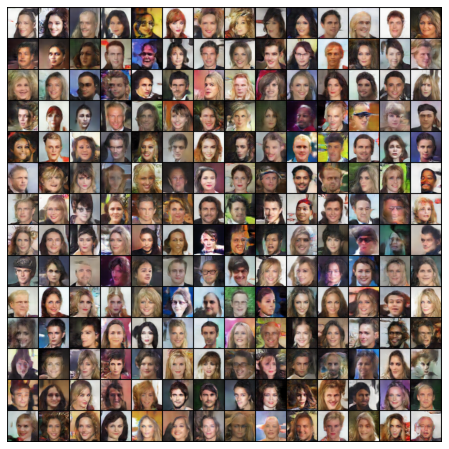

[11025/20000]	Loss_D: 0.5591	Loss_G: 1.4803	D(x): 0.7720	D(G(z)): 0.2175
[11050/20000]	Loss_D: 0.4439	Loss_G: 1.7363	D(x): 0.8010	D(G(z)): 0.1658
[11075/20000]	Loss_D: 0.4881	Loss_G: 1.3615	D(x): 0.7310	D(G(z)): 0.0992
[11100/20000]	Loss_D: 0.5661	Loss_G: 2.2321	D(x): 0.6855	D(G(z)): 0.1094
[11125/20000]	Loss_D: 0.3375	Loss_G: 2.6707	D(x): 0.8578	D(G(z)): 0.1506
[11150/20000]	Loss_D: 1.3228	Loss_G: 0.4081	D(x): 0.3609	D(G(z)): 0.0446
[11175/20000]	Loss_D: 1.0199	Loss_G: 0.3403	D(x): 0.4436	D(G(z)): 0.0421
[11200/20000]	Loss_D: 0.5922	Loss_G: 2.1251	D(x): 0.7377	D(G(z)): 0.1926
[11225/20000]	Loss_D: 0.6509	Loss_G: 3.0467	D(x): 0.9162	D(G(z)): 0.3848
[11250/20000]	Loss_D: 0.5329	Loss_G: 2.9594	D(x): 0.8975	D(G(z)): 0.3143
[11275/20000]	Loss_D: 0.5191	Loss_G: 2.0586	D(x): 0.6782	D(G(z)): 0.0679
[11300/20000]	Loss_D: 0.3909	Loss_G: 1.4983	D(x): 0.7587	D(G(z)): 0.0738
[11325/20000]	Loss_D: 0.6244	Loss_G: 1.5967	D(x): 0.6618	D(G(z)): 0.1360
[11350/20000]	Loss_D: 0.4086	Loss_G: 2.9352	D(x): 0

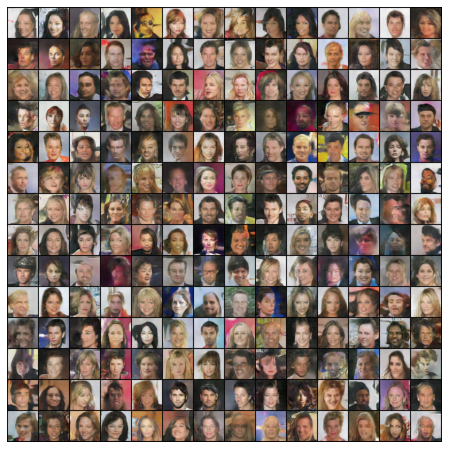

[12025/20000]	Loss_D: 0.4365	Loss_G: 2.0318	D(x): 0.7385	D(G(z)): 0.0841
[12050/20000]	Loss_D: 0.9395	Loss_G: 1.7795	D(x): 0.6180	D(G(z)): 0.2473
[12075/20000]	Loss_D: 1.1720	Loss_G: 1.7219	D(x): 0.5207	D(G(z)): 0.1968
[12100/20000]	Loss_D: 0.5540	Loss_G: 2.3563	D(x): 0.7703	D(G(z)): 0.2049
[12125/20000]	Loss_D: 0.5209	Loss_G: 1.7235	D(x): 0.6796	D(G(z)): 0.0703
[12150/20000]	Loss_D: 0.5030	Loss_G: 2.0743	D(x): 0.8776	D(G(z)): 0.2769
[12175/20000]	Loss_D: 0.6485	Loss_G: 3.6286	D(x): 0.9354	D(G(z)): 0.3959
[12200/20000]	Loss_D: 0.4075	Loss_G: 2.4569	D(x): 0.7707	D(G(z)): 0.0911
[12225/20000]	Loss_D: 2.9957	Loss_G: 4.8623	D(x): 0.9969	D(G(z)): 0.9076
[12250/20000]	Loss_D: 0.4678	Loss_G: 2.2860	D(x): 0.7235	D(G(z)): 0.0748
[12275/20000]	Loss_D: 0.3262	Loss_G: 2.9391	D(x): 0.8326	D(G(z)): 0.1138
[12300/20000]	Loss_D: 2.1796	Loss_G: 1.2697	D(x): 0.1758	D(G(z)): 0.0072
[12325/20000]	Loss_D: 0.6297	Loss_G: 3.1467	D(x): 0.8939	D(G(z)): 0.3570
[12350/20000]	Loss_D: 0.3899	Loss_G: 1.9302	D(x): 0

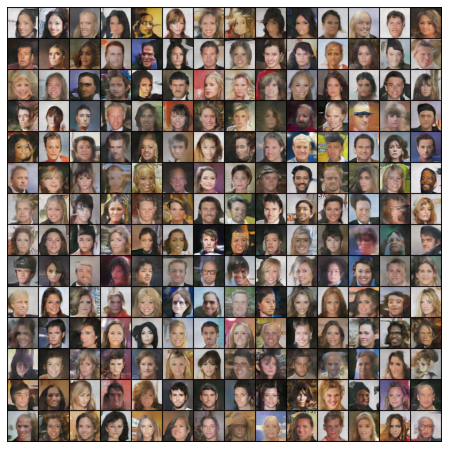

[13025/20000]	Loss_D: 0.6339	Loss_G: 2.0319	D(x): 0.6192	D(G(z)): 0.0658
[13050/20000]	Loss_D: 0.2659	Loss_G: 2.8311	D(x): 0.8935	D(G(z)): 0.1268
[13075/20000]	Loss_D: 0.3233	Loss_G: 2.3585	D(x): 0.8355	D(G(z)): 0.1111
[13100/20000]	Loss_D: 0.2826	Loss_G: 3.1292	D(x): 0.9128	D(G(z)): 0.1603
[13125/20000]	Loss_D: 1.5377	Loss_G: 3.2614	D(x): 0.9451	D(G(z)): 0.6781
[13150/20000]	Loss_D: 0.5376	Loss_G: 1.8099	D(x): 0.6810	D(G(z)): 0.0782
[13175/20000]	Loss_D: 0.3055	Loss_G: 3.1140	D(x): 0.8888	D(G(z)): 0.1499
[13200/20000]	Loss_D: 0.3270	Loss_G: 2.0514	D(x): 0.9082	D(G(z)): 0.1868
[13225/20000]	Loss_D: 0.3912	Loss_G: 3.3787	D(x): 0.9241	D(G(z)): 0.2430
[13250/20000]	Loss_D: 0.6477	Loss_G: 2.0112	D(x): 0.6705	D(G(z)): 0.1301
[13275/20000]	Loss_D: 0.5244	Loss_G: 3.3323	D(x): 0.8798	D(G(z)): 0.2883
[13300/20000]	Loss_D: 0.4341	Loss_G: 3.1921	D(x): 0.8847	D(G(z)): 0.2376
[13325/20000]	Loss_D: 0.2878	Loss_G: 2.5165	D(x): 0.8558	D(G(z)): 0.1041
[13350/20000]	Loss_D: 0.4832	Loss_G: 4.1736	D(x): 0

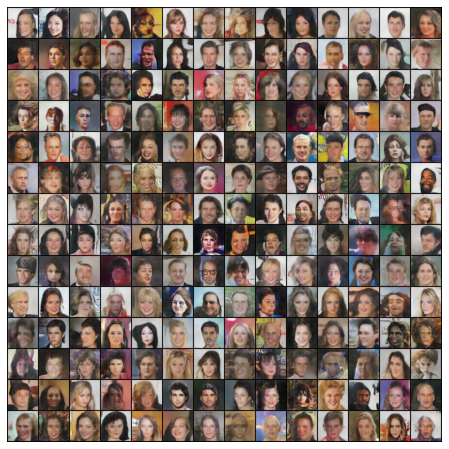

[14025/20000]	Loss_D: 1.2513	Loss_G: 1.1355	D(x): 0.3784	D(G(z)): 0.0253
[14050/20000]	Loss_D: 0.5555	Loss_G: 2.4253	D(x): 0.6375	D(G(z)): 0.0261
[14075/20000]	Loss_D: 0.6334	Loss_G: 3.7429	D(x): 0.9422	D(G(z)): 0.3851
[14100/20000]	Loss_D: 0.6451	Loss_G: 0.9184	D(x): 0.6249	D(G(z)): 0.0783
[14125/20000]	Loss_D: 0.5841	Loss_G: 2.1759	D(x): 0.7065	D(G(z)): 0.1401
[14150/20000]	Loss_D: 0.4065	Loss_G: 3.5515	D(x): 0.9166	D(G(z)): 0.2468
[14175/20000]	Loss_D: 0.3222	Loss_G: 2.8002	D(x): 0.8336	D(G(z)): 0.1069
[14200/20000]	Loss_D: 0.5227	Loss_G: 4.1111	D(x): 0.9587	D(G(z)): 0.3404
[14225/20000]	Loss_D: 0.3374	Loss_G: 1.4462	D(x): 0.8159	D(G(z)): 0.0890
[14250/20000]	Loss_D: 0.4685	Loss_G: 4.5888	D(x): 0.9762	D(G(z)): 0.3259
[14275/20000]	Loss_D: 0.2944	Loss_G: 3.2300	D(x): 0.8347	D(G(z)): 0.0748
[14300/20000]	Loss_D: 0.3932	Loss_G: 1.4944	D(x): 0.7544	D(G(z)): 0.0639
[14325/20000]	Loss_D: 0.8129	Loss_G: 1.1831	D(x): 0.5157	D(G(z)): 0.0414
[14350/20000]	Loss_D: 0.3612	Loss_G: 2.9773	D(x): 0

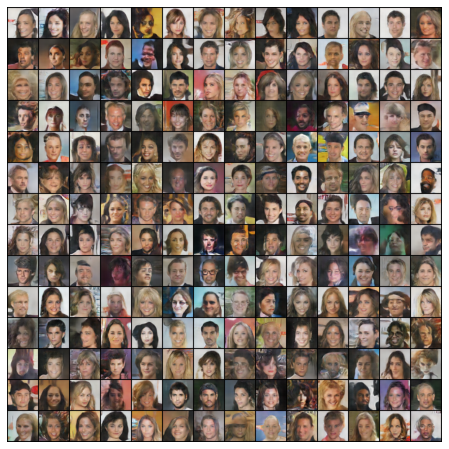

[15025/20000]	Loss_D: 0.2952	Loss_G: 3.5572	D(x): 0.9375	D(G(z)): 0.1796
[15050/20000]	Loss_D: 0.2786	Loss_G: 2.9496	D(x): 0.8552	D(G(z)): 0.0924
[15075/20000]	Loss_D: 2.8980	Loss_G: 4.4777	D(x): 0.9587	D(G(z)): 0.9017
[15100/20000]	Loss_D: 2.6865	Loss_G: 5.8047	D(x): 0.9902	D(G(z)): 0.8848
[15125/20000]	Loss_D: 0.3653	Loss_G: 1.6114	D(x): 0.7993	D(G(z)): 0.0973
[15150/20000]	Loss_D: 0.3871	Loss_G: 3.2703	D(x): 0.8546	D(G(z)): 0.1768
[15175/20000]	Loss_D: 0.2667	Loss_G: 3.3396	D(x): 0.9064	D(G(z)): 0.1372
[15200/20000]	Loss_D: 1.2865	Loss_G: 1.1419	D(x): 0.3615	D(G(z)): 0.0413
[15225/20000]	Loss_D: 0.5519	Loss_G: 3.9198	D(x): 0.9148	D(G(z)): 0.3253
[15250/20000]	Loss_D: 0.3908	Loss_G: 2.2172	D(x): 0.7408	D(G(z)): 0.0454
[15275/20000]	Loss_D: 0.2672	Loss_G: 3.3528	D(x): 0.9081	D(G(z)): 0.1432
[15300/20000]	Loss_D: 0.2617	Loss_G: 3.0068	D(x): 0.8388	D(G(z)): 0.0620
[15325/20000]	Loss_D: 1.0914	Loss_G: 3.9183	D(x): 0.9678	D(G(z)): 0.5824
[15350/20000]	Loss_D: 1.0146	Loss_G: 2.0957	D(x): 0

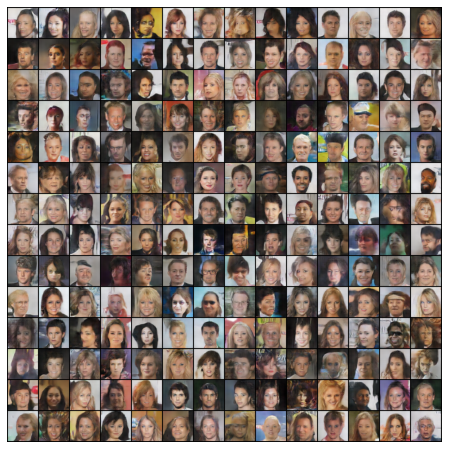

[16025/20000]	Loss_D: 0.3212	Loss_G: 2.3123	D(x): 0.8548	D(G(z)): 0.1260
[16050/20000]	Loss_D: 0.3568	Loss_G: 3.5557	D(x): 0.9322	D(G(z)): 0.2220
[16075/20000]	Loss_D: 0.2851	Loss_G: 3.5836	D(x): 0.9544	D(G(z)): 0.1955
[16100/20000]	Loss_D: 0.1915	Loss_G: 3.7241	D(x): 0.9520	D(G(z)): 0.1217
[16125/20000]	Loss_D: 0.1991	Loss_G: 4.2776	D(x): 0.9607	D(G(z)): 0.1369
[16150/20000]	Loss_D: 0.2069	Loss_G: 3.1962	D(x): 0.8895	D(G(z)): 0.0752
[16175/20000]	Loss_D: 0.3484	Loss_G: 2.5467	D(x): 0.8375	D(G(z)): 0.1271
[16200/20000]	Loss_D: 0.5050	Loss_G: 2.3349	D(x): 0.7691	D(G(z)): 0.1676
[16225/20000]	Loss_D: 0.3134	Loss_G: 4.1104	D(x): 0.9477	D(G(z)): 0.2063
[16250/20000]	Loss_D: 0.2275	Loss_G: 3.9387	D(x): 0.9269	D(G(z)): 0.1281
[16275/20000]	Loss_D: 1.0134	Loss_G: 5.4429	D(x): 0.9735	D(G(z)): 0.5348
[16300/20000]	Loss_D: 0.3236	Loss_G: 3.5940	D(x): 0.9354	D(G(z)): 0.2038
[16325/20000]	Loss_D: 0.2396	Loss_G: 2.7078	D(x): 0.8585	D(G(z)): 0.0635
[16350/20000]	Loss_D: 0.5652	Loss_G: 1.7658	D(x): 0

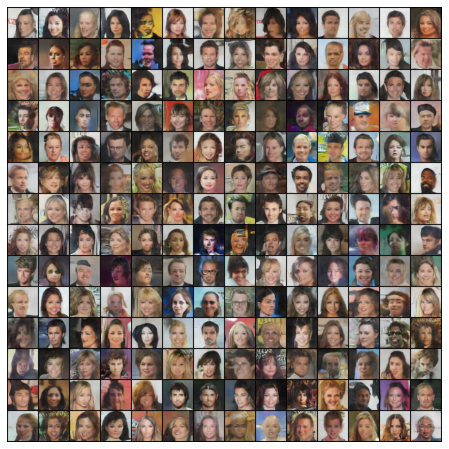

[17025/20000]	Loss_D: 0.5339	Loss_G: 1.6985	D(x): 0.6416	D(G(z)): 0.0253
[17050/20000]	Loss_D: 0.3062	Loss_G: 2.9641	D(x): 0.9088	D(G(z)): 0.1591
[17075/20000]	Loss_D: 1.5574	Loss_G: 0.6769	D(x): 0.3032	D(G(z)): 0.0313
[17100/20000]	Loss_D: 0.3034	Loss_G: 3.2438	D(x): 0.8831	D(G(z)): 0.1421
[17125/20000]	Loss_D: 0.3098	Loss_G: 1.8324	D(x): 0.8275	D(G(z)): 0.0885
[17150/20000]	Loss_D: 0.2563	Loss_G: 2.6414	D(x): 0.8929	D(G(z)): 0.1168
[17175/20000]	Loss_D: 0.6480	Loss_G: 1.4362	D(x): 0.6185	D(G(z)): 0.0536
[17200/20000]	Loss_D: 0.5221	Loss_G: 2.1886	D(x): 0.6407	D(G(z)): 0.0147
[17225/20000]	Loss_D: 0.1830	Loss_G: 2.9324	D(x): 0.8960	D(G(z)): 0.0594
[17250/20000]	Loss_D: 0.9247	Loss_G: 0.9854	D(x): 0.4785	D(G(z)): 0.0131
[17275/20000]	Loss_D: 0.4388	Loss_G: 3.5540	D(x): 0.9180	D(G(z)): 0.2419
[17300/20000]	Loss_D: 0.2181	Loss_G: 2.9211	D(x): 0.8784	D(G(z)): 0.0726
[17325/20000]	Loss_D: 0.2703	Loss_G: 3.6556	D(x): 0.9684	D(G(z)): 0.1918
[17350/20000]	Loss_D: 0.5292	Loss_G: 1.8770	D(x): 0

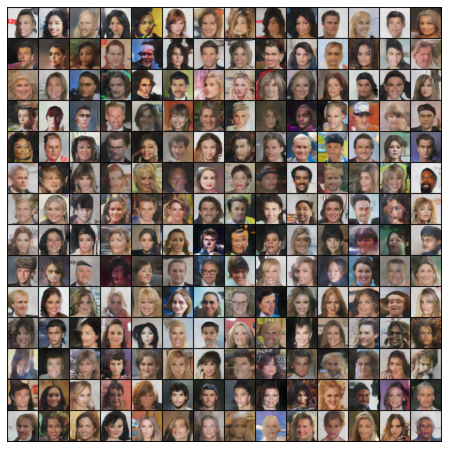

[18025/20000]	Loss_D: 0.2090	Loss_G: 3.1708	D(x): 0.8593	D(G(z)): 0.0402
[18050/20000]	Loss_D: 0.2022	Loss_G: 3.4814	D(x): 0.9269	D(G(z)): 0.1095
[18075/20000]	Loss_D: 0.1229	Loss_G: 3.4242	D(x): 0.9465	D(G(z)): 0.0615
[18100/20000]	Loss_D: 0.1958	Loss_G: 4.3557	D(x): 0.9149	D(G(z)): 0.0915
[18125/20000]	Loss_D: 0.8945	Loss_G: 1.2530	D(x): 0.5545	D(G(z)): 0.1673
[18150/20000]	Loss_D: 0.2759	Loss_G: 3.3384	D(x): 0.8853	D(G(z)): 0.1226
[18175/20000]	Loss_D: 1.1926	Loss_G: 0.9777	D(x): 0.3928	D(G(z)): 0.0357
[18200/20000]	Loss_D: 0.7822	Loss_G: 6.5676	D(x): 0.9682	D(G(z)): 0.4539
[18225/20000]	Loss_D: 0.2923	Loss_G: 3.5682	D(x): 0.9240	D(G(z)): 0.1558
[18250/20000]	Loss_D: 0.4066	Loss_G: 3.6681	D(x): 0.9056	D(G(z)): 0.2327
[18275/20000]	Loss_D: 0.3591	Loss_G: 1.8717	D(x): 0.7893	D(G(z)): 0.0852
[18300/20000]	Loss_D: 0.3311	Loss_G: 2.5984	D(x): 0.7698	D(G(z)): 0.0381
[18325/20000]	Loss_D: 0.1813	Loss_G: 3.1733	D(x): 0.9412	D(G(z)): 0.1009
[18350/20000]	Loss_D: 0.1639	Loss_G: 3.1967	D(x): 0

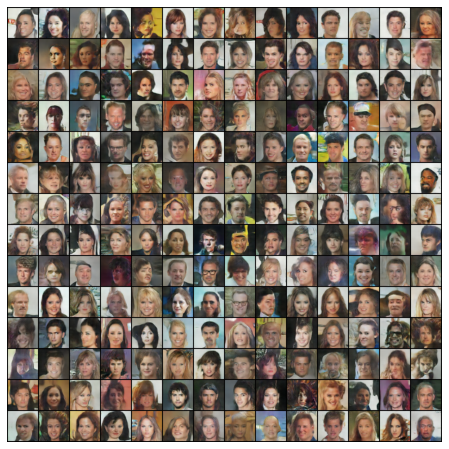

[19025/20000]	Loss_D: 0.1972	Loss_G: 3.2620	D(x): 0.9210	D(G(z)): 0.0947
[19050/20000]	Loss_D: 0.1550	Loss_G: 4.0081	D(x): 0.9475	D(G(z)): 0.0893
[19075/20000]	Loss_D: 0.3999	Loss_G: 3.0716	D(x): 0.8666	D(G(z)): 0.1955
[19100/20000]	Loss_D: 0.1773	Loss_G: 2.7685	D(x): 0.9375	D(G(z)): 0.0978
[19125/20000]	Loss_D: 0.2737	Loss_G: 2.9848	D(x): 0.8069	D(G(z)): 0.0297
[19150/20000]	Loss_D: 0.1180	Loss_G: 3.5832	D(x): 0.9589	D(G(z)): 0.0700
[19175/20000]	Loss_D: 1.1480	Loss_G: 0.8074	D(x): 0.4406	D(G(z)): 0.0852
[19200/20000]	Loss_D: 0.2653	Loss_G: 3.9842	D(x): 0.9698	D(G(z)): 0.1879
[19225/20000]	Loss_D: 0.1953	Loss_G: 2.4857	D(x): 0.8625	D(G(z)): 0.0352
[19250/20000]	Loss_D: 0.5184	Loss_G: 1.4925	D(x): 0.6712	D(G(z)): 0.0347
[19275/20000]	Loss_D: 0.2913	Loss_G: 3.3084	D(x): 0.9458	D(G(z)): 0.1895
[19300/20000]	Loss_D: 0.2369	Loss_G: 4.0795	D(x): 0.9129	D(G(z)): 0.1184
[19325/20000]	Loss_D: 0.2271	Loss_G: 2.8407	D(x): 0.8875	D(G(z)): 0.0833
[19350/20000]	Loss_D: 0.2565	Loss_G: 2.2390	D(x): 0

In [ ]:
img_list = []
G_losses = []
D_losses = []

for i in range(steps):
    # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    for _ in range(nb_update_D):
        netD.zero_grad()
        
        # Create batches
        x_real, y_real = get_batch_real()
        x_fake, y_fake = get_batch_fake()
        
        # Forward 
        y_hat_real = netD(x_real).float() # TODO
        y_hat_fake = netD(x_fake).float() # TODO

        errD = criterion(y_hat_real.view(-1),y_real.float())+criterion(y_hat_fake.view(-1),y_fake.float())       # TODO sum of criterion of real and fake samples
        
        # Backward
        # TODO backward & optimization step on D
        errD.backward()
        optimizerD.step()
        
        avg_output_for_real = y_hat_real.mean().item()
        avg_output_for_fake = y_hat_fake.mean().item()    
        D_losses.append(errD.item())
      


    ########
    # Update G network: maximize log(D(G(z)))
    for _ in range(nb_update_G):
        netG.zero_grad()
 
        x_fake, y_fake = get_batch_fake(train_G=True)
        y_hat_fake = netD(x_fake)
        errG = criterion(y_hat_fake.view(-1),y_fake.float())

        errG.backward()
        optimizerG.step()
        # Compute / save metrics
        G_losses.append(errG.item())
        
    
    ########
    # Logs
    if i % 25 == 0:
        print('[%5d/%5d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
              % (i, steps, errD.item(), errG.item(), avg_output_for_real, avg_output_for_fake))

    if i % 1000 == 0:
        with torch.no_grad():
            x_fake = netG(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(x_fake, padding=2, normalize=True, nrow=14))
        plt.figure(figsize=(8,8))
        plt.imshow(np.transpose(img_list[-1],(1,2,0)))
        plt.axis("off")
        plt.show()

Le code ci-dessous applique votre réseau à un batch de $z$ aléatoires et affiche les images générées (et enregistre dans fake.png). 

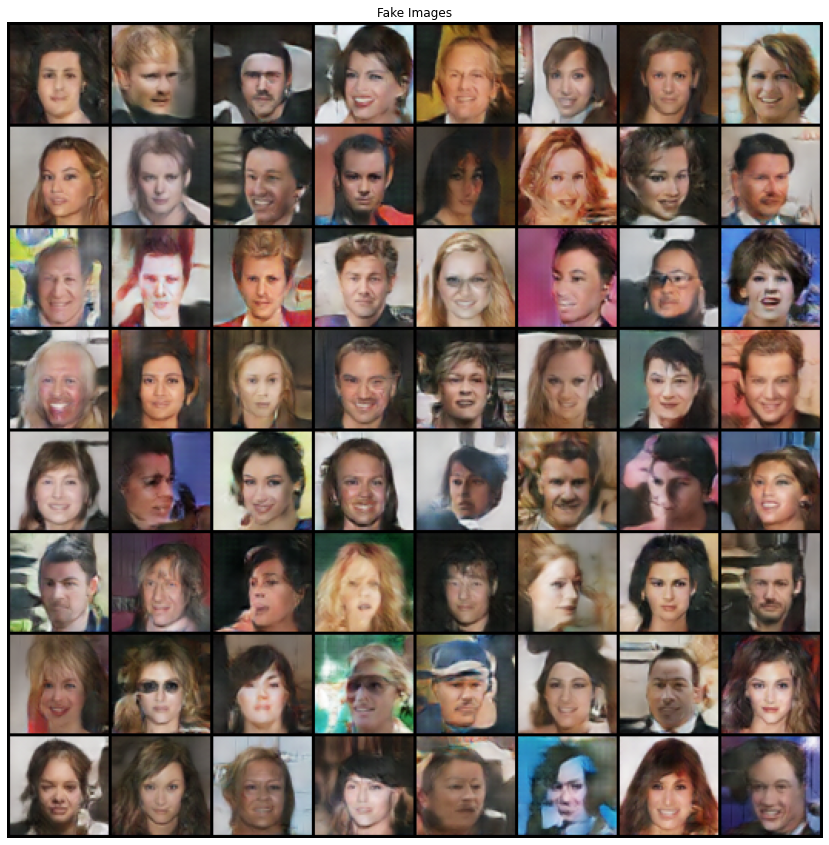

In [ ]:
noise = torch.randn(64, nz, 1, 1, device=device)
with torch.no_grad():
  netG.eval()
  fake = netG(noise).detach().cpu()
img=vutils.make_grid(fake, padding=2, normalize=True)
img_list.append(img)
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img.cpu(),(1,2,0)))
plt.savefig( "fake.png" )


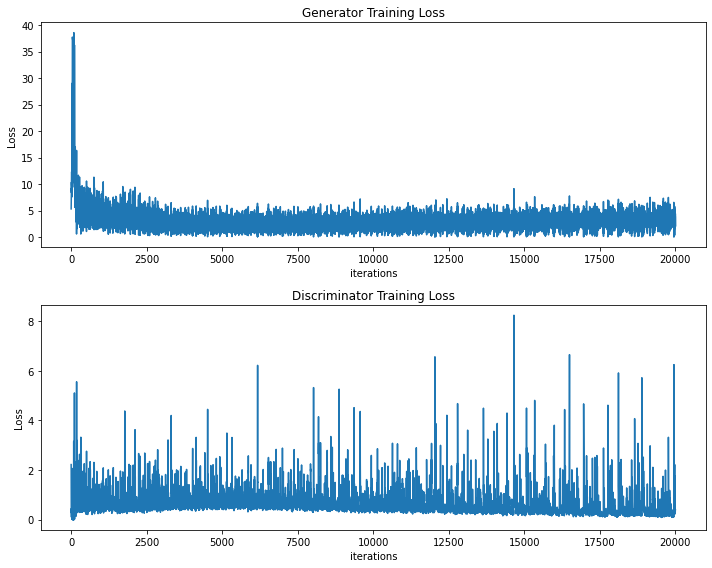

In [ ]:

# Loss evolution
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
plt.title("Generator Training Loss")
plt.plot(G_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")

plt.subplot(2,1,2)
plt.title("Discriminator Training Loss")
plt.plot(D_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")

plt.tight_layout()
plt.show()

Le générateur du papier original DCGAN possède en fait l'architecture suivante: 

![Generator](https://pytorch.org/tutorials/_images/dcgan_generator.png)

Comme le réseau $G$ définit plus haut, il correspond à un empilement de couches de convolutions transposées (appelée dans certains papiers couches de déconvolution). Contrairement aux convolutions classiques qui mènent à une réduction de la taille des sorties, les convolutions transposées agrandissent les cartes de caractéristiques considérées (feature maps). C'est particulièrement adapté pour de la génération d'images à partir d'un code de petite taille (ici $z$). 

 Pour comprendre comment fonctionne la convolution transposée, voici un exemple simple avec une entrée 2 x 2 et un noyau 2 x 2. Chaque élément de l'entrée (4 éléments) est multiplié par le noyau et le résultat est ajouté à la sorte de taille 3 x 3: 

![BasicTransposeConv2D](http://d2l.ai/_images/trans-conv.svg)

Et voici deux animations pour se représenter l'opération d'une manière plus générale. A gauche on utilise un stride de 1, à droite un stride de 2: 

<p align="center">
<img src="https://i.stack.imgur.com/YyCu2.gif">
<img src="https://i.stack.imgur.com/f2RiP.gif">
</p>


Suivant la doc Pytorch de torch.nn.ConvTranspose2d, la hauteur $H_{out}$ et la largeur $W_{out}$ des cartes de sortie du ConvTranspose2d peuvent se calculer de la manière suivante: 

$H_{out}$=($H_{in}$−1)×stride−2×padding+dilation×(kernel_size−1)+output_padding+1

$W_{out}$=($W_{in}$−1)×stride−2×padding+dilation×(kernel_size−1)+output_padding+1


Proposer un nouveau réseau $G$ qui respecte l'architecture du schéma du papier DCGAN et comparer les résultats. On gardera le paramètre de dilation à sa valeur de 1 par défaut mais il est possible de moduler les valeurs de padding et output_padding pour obtenir des sorties de la taille désirée. 


In [ ]:
nz=100  #Taille du vecteur z donné en entrée du générateur
ngf = 64 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.Upsample(scale_factor=2),
            # state size. (ngf*8) x 8 x 8
            nn.Conv2d(ngf * 8, ngf * 4, 3, stride=1, padding=1),
            nn.BatchNorm2d(ngf * 4, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            # state size. (ngf*8) x 16 x 16
            nn.Conv2d(ngf * 4, ngf * 2, 3, stride=1, padding=1),
            nn.BatchNorm2d(ngf * 2, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            # state size. (ngf*8) x 32 x 32
            nn.Conv2d(ngf * 2, ngf * 2, 3, stride=1, padding=1),
            nn.BatchNorm2d(ngf * 2, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            # state size. (ngf*8) x 64 x 64
            nn.Conv2d(ngf * 2, ngf , 3, stride=1, padding=1),
            nn.BatchNorm2d(ngf, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ngf, 3, 3, stride=1, padding=1),
            nn.Tanh(),

        )

    def forward(self, input):
        return self.main(input)
netG = Generator().to(device)
netG.apply(weights_init)




Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Upsample(scale_factor=2.0, mode=nearest)
    (4): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Upsample(scale_factor=2.0, mode=nearest)
    (8): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Upsample(scale_factor=2.0, mode=nearest)
    (12): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (14): Le

[    0/20000]	Loss_D: 1.6529	Loss_G: 0.6042	D(x): 0.6199	D(G(z)): 0.6082


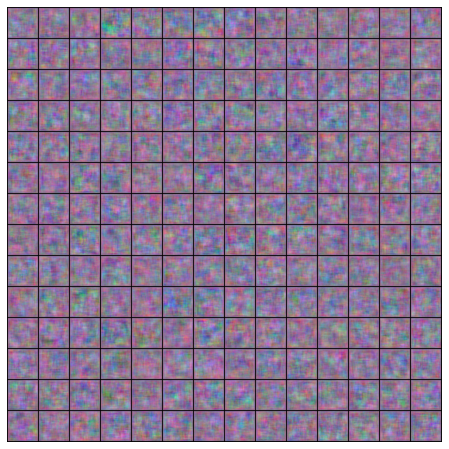

[   25/20000]	Loss_D: 1.4471	Loss_G: 0.6320	D(x): 0.6621	D(G(z)): 0.5541
[   50/20000]	Loss_D: 1.6324	Loss_G: 0.6354	D(x): 0.6407	D(G(z)): 0.6087
[   75/20000]	Loss_D: 1.5540	Loss_G: 0.6926	D(x): 0.6270	D(G(z)): 0.5658
[  100/20000]	Loss_D: 1.5901	Loss_G: 0.6707	D(x): 0.6475	D(G(z)): 0.5973
[  125/20000]	Loss_D: 1.6841	Loss_G: 0.6479	D(x): 0.6251	D(G(z)): 0.6124
[  150/20000]	Loss_D: 1.7920	Loss_G: 0.6643	D(x): 0.6135	D(G(z)): 0.6260
[  175/20000]	Loss_D: 1.6751	Loss_G: 0.5822	D(x): 0.6233	D(G(z)): 0.5980
[  200/20000]	Loss_D: 1.6356	Loss_G: 0.6474	D(x): 0.6487	D(G(z)): 0.6000
[  225/20000]	Loss_D: 1.5599	Loss_G: 0.6089	D(x): 0.6715	D(G(z)): 0.6021
[  250/20000]	Loss_D: 1.6807	Loss_G: 0.6150	D(x): 0.6542	D(G(z)): 0.6286
[  275/20000]	Loss_D: 1.5297	Loss_G: 0.5948	D(x): 0.6337	D(G(z)): 0.5697
[  300/20000]	Loss_D: 1.6254	Loss_G: 0.6331	D(x): 0.6555	D(G(z)): 0.6117
[  325/20000]	Loss_D: 1.6715	Loss_G: 0.6014	D(x): 0.6295	D(G(z)): 0.6025
[  350/20000]	Loss_D: 1.7135	Loss_G: 0.6244	D(x): 0

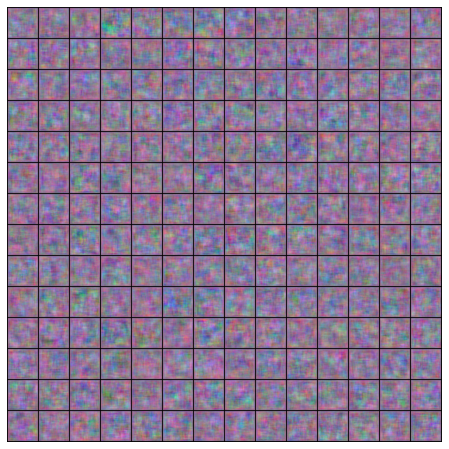

[ 1025/20000]	Loss_D: 1.5802	Loss_G: 0.6524	D(x): 0.6492	D(G(z)): 0.5849


KeyboardInterrupt: ignored

In [ ]:
img_list = []
G_losses = []
D_losses = []
nb_update_G = 5
for i in range(steps):
    # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    for _ in range(nb_update_D):
        netD.zero_grad()
        
        # Create batches
        x_real, y_real = get_batch_real()
        x_fake, y_fake = get_batch_fake()
        
        # Forward 
        y_hat_real = netD(x_real).float() # TODO
        y_hat_fake = netD(x_fake).float() # TODO

        errD = criterion(y_hat_real.view(-1),y_real.float())+criterion(y_hat_fake.view(-1),y_fake.float())       # TODO sum of criterion of real and fake samples
        
        # Backward
        # TODO backward & optimization step on D
        errD.backward()
        optimizerD.step()
        
        avg_output_for_real = y_hat_real.mean().item()
        avg_output_for_fake = y_hat_fake.mean().item()    
        D_losses.append(errD.item())
      


    ########
    # Update G network: maximize log(D(G(z)))
    for _ in range(nb_update_G):
        netG.zero_grad()
 
        x_fake, y_fake = get_batch_fake(train_G=True)
        y_hat_fake = netD(x_fake)
        errG = criterion(y_hat_fake.view(-1),y_fake.float())

        errG.backward()
        optimizerG.step()
        # Compute / save metrics
        G_losses.append(errG.item())
        
    
    ########
    # Logs
    if i % 25 == 0:
        print('[%5d/%5d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
              % (i, steps, errD.item(), errG.item(), avg_output_for_real, avg_output_for_fake))

    if i % 1000 == 0:
        with torch.no_grad():
            x_fake = netG(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(x_fake, padding=2, normalize=True, nrow=14))
        plt.figure(figsize=(8,8))
        plt.imshow(np.transpose(img_list[-1],(1,2,0)))
        plt.axis("off")
        plt.show()

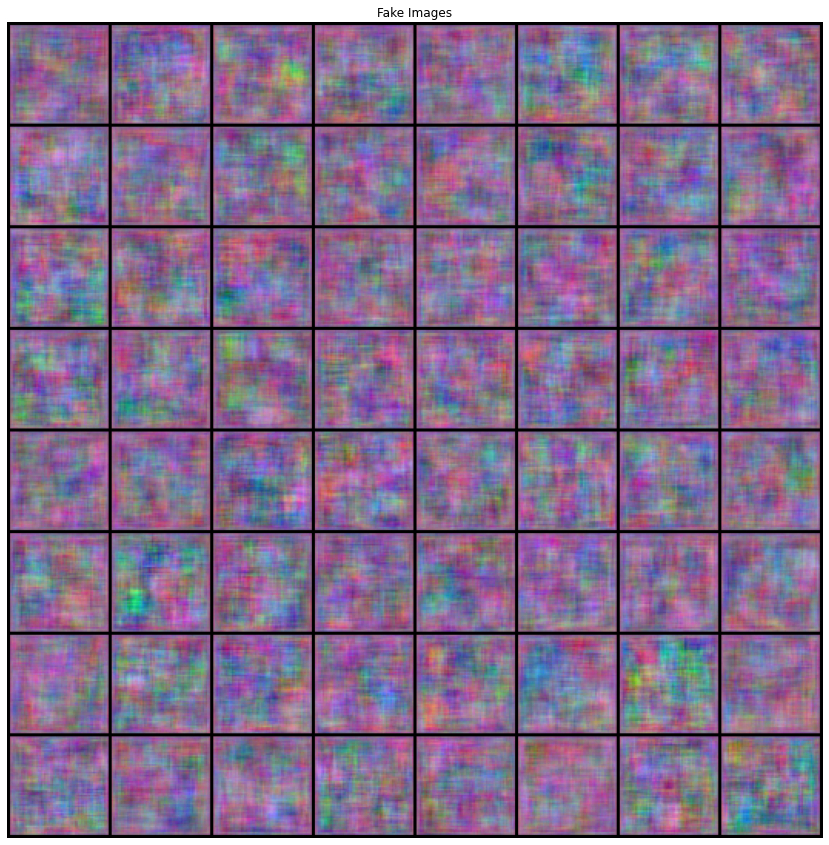

In [ ]:
noise = torch.randn(64, nz, 1, 1, device=device)
with torch.no_grad():
  netG.eval()
  fake = netG(noise).detach().cpu()
img=vutils.make_grid(fake, padding=2, normalize=True)
img_list.append(img)
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img.cpu(),(1,2,0)))
plt.savefig( "fake.png" )


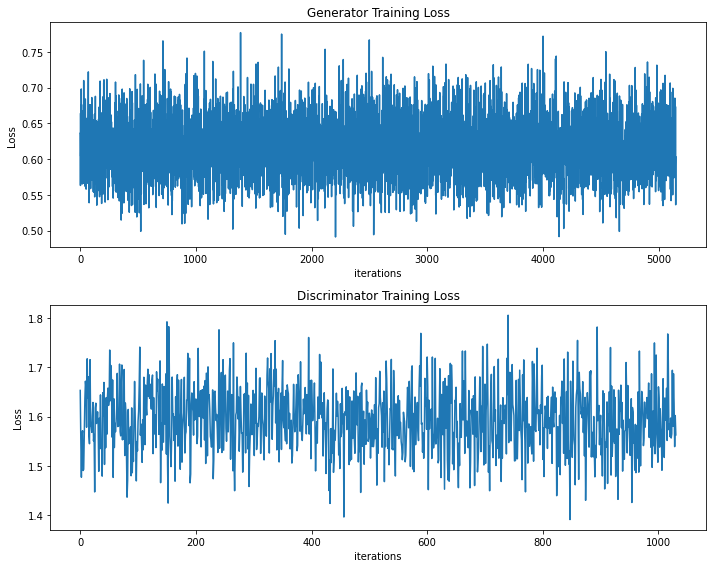

In [ ]:

# Loss evolution
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
plt.title("Generator Training Loss")
plt.plot(G_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")

plt.subplot(2,1,2)
plt.title("Discriminator Training Loss")
plt.plot(D_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")

plt.tight_layout()
plt.show()